In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3

In [2]:
# Establishing connection with database 

con = sqlite3.connect(r'C:\Users\shikh\OneDrive\Desktop\DA Project\Amazon/database.sqlite')

In [3]:
type(con)

sqlite3.Connection

In [4]:
# Reading the data from DB

In [5]:
df = pd.read_sql_query('select * from Reviews', con)

In [6]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [7]:
df.shape

(568454, 10)

In [8]:
csv_data = pd.read_csv(r'C:\Users\shikh\OneDrive\Desktop\DA Project\Amazon/Reviews.csv')

In [9]:
# Sentiment analysis on data 

In [10]:
!pip install TextBlob

In [11]:
from textblob import TextBlob

In [12]:
text = df['Summary'][0]
text

'Good Quality Dog Food'

In [13]:
TextBlob(text).sentiment.polarity #positive polarity close to +1 means good sentiment

0.7

In [14]:
# sentiment analysis on summary column 

polarity =[] #empty polarity list

for i in df['Summary']:
    try:
        polarity.append(TextBlob(i).sentiment.polarity)
    except:
        polarity.append(0) # for null values fill 0 
        

In [15]:
len(polarity)

568454

In [16]:
data = df.copy()

In [17]:
data['Polarity'] = polarity
data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Polarity
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,0.7
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0.0
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,0.0
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,0.0
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,0.8


In [18]:
# EDA for positive sentences

In [19]:
 data_positive = data[data['Polarity']>0]

In [20]:
data_positive.shape

(331665, 11)

In [21]:
# On what values of the column summary suer is going to emphasize

In [22]:
!pip install wordcloud 

In [23]:
from wordcloud import WordCloud, STOPWORDS

In [24]:
stopwords = set(STOPWORDS)

In [25]:
# Joining the summary column 

total_text = (' '.join(data_positive['Summary']))

In [26]:
len(total_text)

8465012

In [27]:
total_text[0:1000]

'Good Quality Dog Food Great taffy Nice Taffy Great!  Just as good as the expensive brands! Wonderful, tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this "diet" food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy! Love it! GREAT SWEET CANDY! Always fresh Delicious product! Great Bargain for the Price The Best Hot Sauce in the World Great machine! Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry! satisfying Love Gluten Free Oatmeal!!! GOOD WAY TO START THE DAY.... Wife\'s favorite Breakfast Why wouldn\'t you buy oatmeal from Mcanns? Tastes great! Good Hot Breakfast Great taste and convenience good Very good but next time I won\'t order the Variety Pack HOT!  And good!  Came back for more  :) Roasts up a smooth brew Our guests love it! Awesome Deal! Awsome - Kids in neighborhood loved us! great deal. Better price for this at Target great source of electrolytes Great for preventing cramps T

In [28]:
# Remove dots and special characters

In [29]:
# Modification, cleaning of text data can be done using the RE i.e the regular expression module 
import re
total_text = re.sub('[^a-zA-z]', ' ', total_text) #except a-z or A-Z replace everything else with blank space

In [30]:
# Remove extra spaces

total_text=re.sub(' +',' ',total_text) #replace extra spaces with more than one extra space with one extra space

(-0.5, 999.5, 499.5, -0.5)

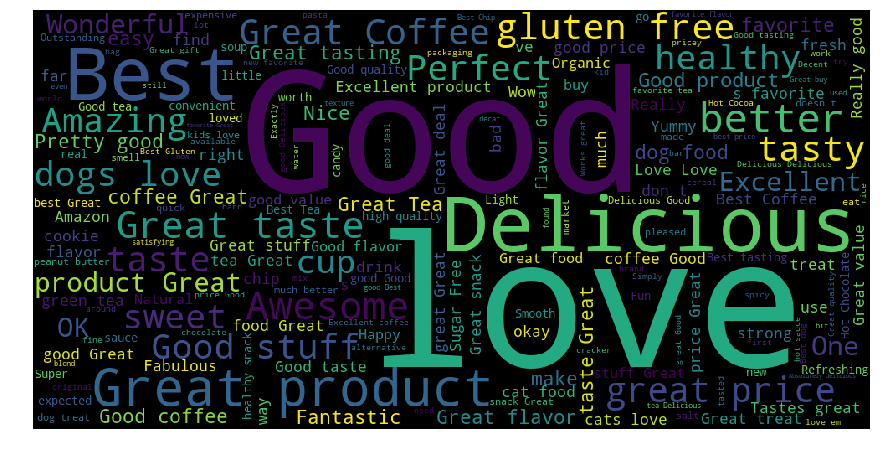

In [31]:
#Generation of word cloud to see the most emphasized words by customers

wordcloud = WordCloud(width=1000, height= 500, stopwords=stopwords).generate(total_text)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis('off')
#imshow is for displaying data as image 

(-0.5, 999.5, 499.5, -0.5)

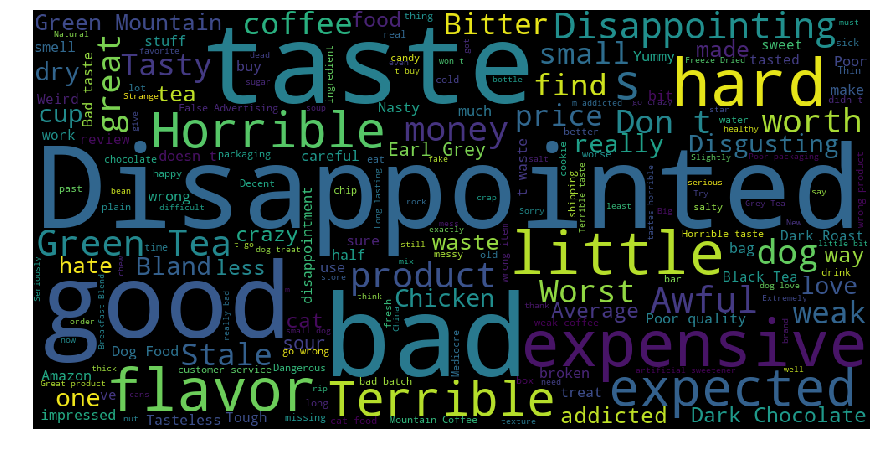

In [32]:
#EDA on negative words

data_negative = data[data['Polarity']<0]
total_text2 = (' '.join(data_negative['Summary']))
total_text2 = re.sub('[^a-zA-z]', ' ', total_text2) #except a-z or A-Z replace everything else with blank space
total_text2 = re.sub(' +',' ',total_text2) #replace extra spaces with more than one extra space with one extra space


#Generation of word cloud to see the most emphasized words by customers

wordcloud2 = WordCloud(width=1000, height= 500, stopwords=stopwords).generate(total_text2)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud2)
plt.axis('off')
#imshow is for displaying data as image 

In [33]:
#Analysis of, to which users amazon can recommend more products 

df['UserId'].nunique()

256059

In [34]:
raw = df.groupby('UserId').agg({'Summary':'count','Text':'count','Score':'mean','ProductId':'count'}).sort_values(by='Text', ascending=False)

In [35]:
raw.columns = ['Summary_count','Text_count','Mean_score','ProductId_Count']

In [36]:
raw.head()

,Summary_count,Text_count,Mean_score,ProductId_Count
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256


In [37]:
user_10 = raw.index[0:10]
number_10 = raw['ProductId_Count'][0:10]

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], <a list of 10 Text xticklabel objects>)

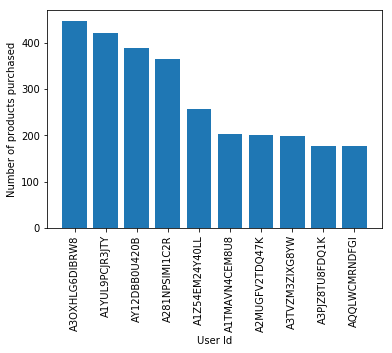

In [38]:
plt.bar(user_10, number_10, label='most recommended users')
plt.xlabel('User Id')
plt.ylabel('Number of products purchased')
plt.xticks(rotation='vertical')

In [39]:
# Analyzing the length of comments given by users

In [40]:
df1 = data.duplicated().sum()

In [41]:
x = len(data['Text'][0].split(' '))

In [42]:
# Finding the length of each comment

def com_len(text):
    return len(text.split(' '))
    

In [43]:
data['text_len'] = data['Text'].apply(com_len)

In [44]:
import plotly.express as px

In [45]:
px.box(data, y='text_len')

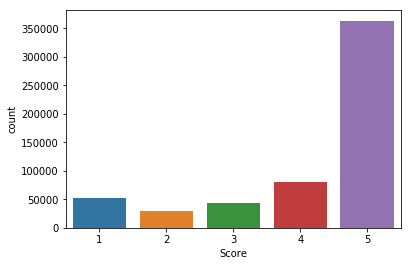

In [46]:
sns.countplot(df['Score'])

In [47]:
# Analysing the behaviour of customer

In [48]:
data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Polarity,text_len
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,0.7,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0.0,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,0.0,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,0.0,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,0.8,30


In [49]:
final=df.sample(n=2000)

In [50]:
final=df[0:2000]

In [51]:
final.isna().sum()

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
dtype: int64

In [52]:
final.duplicated().sum()

0

In [70]:
# Check if URL's are present in the text column 

In [71]:
final['Text'].str.contains('http?').sum()

35

In [72]:
final['Text'].str.contains('http').sum()

35

In [73]:
pd.set_option('display.max_rows',2000)
final['Text'].str.contains('http',regex=True)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21       True
22      False
23      False
24      False
25       True
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39       True
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [74]:
final['Text'][21]

'i bought these for my husband who is currently overseas he loves these and apparently his staff likes them alsobr there are generous amounts of twizzlers in each 16ounce bag and this was well worth the price a hrefhttpwwwamazoncomgpproductb001gvisjmtwizzlers strawberry 16ounce bags pack of 6a'

In [75]:
review=final['Text'][21]
review

'i bought these for my husband who is currently overseas he loves these and apparently his staff likes them alsobr there are generous amounts of twizzlers in each 16ounce bag and this was well worth the price a hrefhttpwwwamazoncomgpproductb001gvisjmtwizzlers strawberry 16ounce bags pack of 6a'

In [76]:
import re

In [77]:
import re
def remove_urls(review):
    url_pattern = re.compile(r'href|http.\w+')
    return url_pattern.sub(r'', review)

In [78]:
final['Text'] = final['Text'].apply(remove_urls)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [79]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide...,30


In [80]:
final['Text'].str.contains('http').sum()

0

In [81]:
final['Text'][34]

'instant oatmeal can become soggy the minute the water hits the bowl mccanns instant oatmeal holds its texture has excellent flavor and is good for you all at the same time mccanns regular oat meal is excellent too but may take a bit longer to prepare than most have time for in the morning this is the best instant brand ive ever eaten and a very close second to the noninstant varietybr br mccanns instant irish oatmeal variety pack of regular apples  cinnamon and maple  brown sugar 10count boxes pack of 6'

In [83]:
# relacing 'br' from paragraph

final['Text'][34].replace('br','')


'instant oatmeal can become soggy the minute the water hits the bowl mccanns instant oatmeal holds its texture has excellent flavor and is good for you all at the same time mccanns regular oat meal is excellent too but may take a bit longer to prepare than most have time for in the morning this is the best instant and ive ever eaten and a very close second to the noninstant variety  mccanns instant irish oatmeal variety pack of regular apples  cinnamon and maple  own sugar 10count boxes pack of 6'

In [84]:
#function for removing 'br' from text

for i in range(len(final['Text'])):
    final['Text'][i]=final['Text'][i].replace('br','')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3296: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [93]:
## Advantages of Word Clouds :
## Analyzing customer and employee feedback.
## Identifying new SEO keywords to target.

In [94]:
data2=final.copy()

In [95]:
data2['Text'][34]

'instant oatmeal can become soggy the minute the water hits the bowl mccanns instant oatmeal holds its texture has excellent flavor and is good for you all at the same time mccanns regular oat meal is excellent too but may take a bit longer to prepare than most have time for in the morning this is the best instant and ive ever eaten and a very close second to the noninstant variety  mccanns instant irish oatmeal variety pack of regular apples  cinnamon and maple  own sugar 10count boxes pack of 6'

In [96]:
data2.shape

(2000, 11)

In [97]:
from wordcloud import WordCloud, STOPWORDS 

In [98]:
stopwords = set(STOPWORDS) 

In [99]:
comment_words = '' 
for val in data2['Text']:
    # typecaste each val to string
    
    # split the value 
    tokens = val.split() 
    
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
    comment_words=comment_words+ " ".join(tokens)+" "
    

In [100]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

(-0.5, 799.5, 799.5, -0.5)

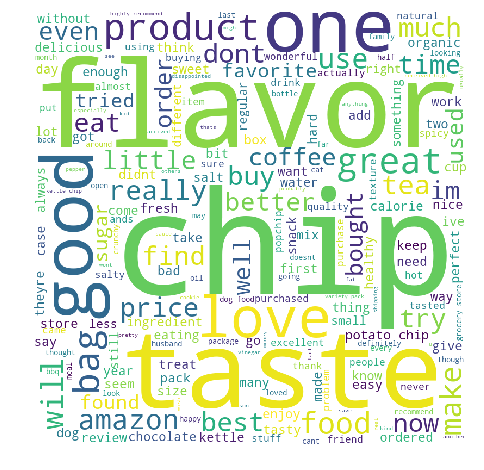

In [101]:
# plot the WordCloud image                        
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 